<a href="https://colab.research.google.com/github/evanparisya/PCVK25_3F_09/blob/main/CM.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Identitas Diri
- Nama: Evan Parisya Adriel
- Kelas: TI-3F
- NIM: 2341720179

#Bagian A - Observasi & Eksperimen
Gunakan 3 citra batik / sayur (misalnya data1.jpg, data2.jpg, data3.jpg) dengan variasi
kondisi cahaya.
Ambil 3 foto data sesuai object yang dipilih di tempat berbeda:
1. Dalam ruangan minim cahaya (lampu Sebagian mati)
2. Di bawah lampu terang
3. Di samping jendela dengan cahaya datang dari satu arah

Lakukan Observasi dan Eksperimen berikut ini :
1. Tampilkan histogram tiap citra dan analisis distribusi intensitasnya.
2. Terapkan transformasi brightness dan contrast (linear/log brightness).
- Tentukan nilai b (brightness) dan a (contrast) yang sesuai agar data
tampak natural seperti data asli.
3. Lakukan histogram equalization untuk memperbaiki sebaran kontras.
- Bandingkan hasil visual dan histogram sebelum–sesudah.
- Perhatikan apakah motif dan detail kain lebih terlihat jelas.
- Pastikan tekstur daun atau permukaan sayur menjadi lebih terlihat.
4. Terapkan filter spasial:
- Low-pass filter untuk menghaluskan noise atau tekstur berlebih pada
permukaan kain, untuk menghaluskan noise pada permukaan atau
bayangan di sekitar sayur.
- High-pass atau Laplacian filter untuk menajamkan tepi motif batik atau
untuk menajamkan tepi daun, batang, atau detail tekstur pada sayur.
5. Implementasikan Floyd–Steinberg Dithering untuk menurunkan kedalaman
warna sesuai data anda (bit-depth 4–6 bit), lalu analisis bagaimana efeknya
terhadap kehalusan gradasi warna motif batik setelah reduksi warna dilakukan
atau terhadap detail warna alami sayur

In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
from scipy.signal import convolve2d

# 1. Tampilkan histogram tiap citra dan analisis distribusi intensitasnya.

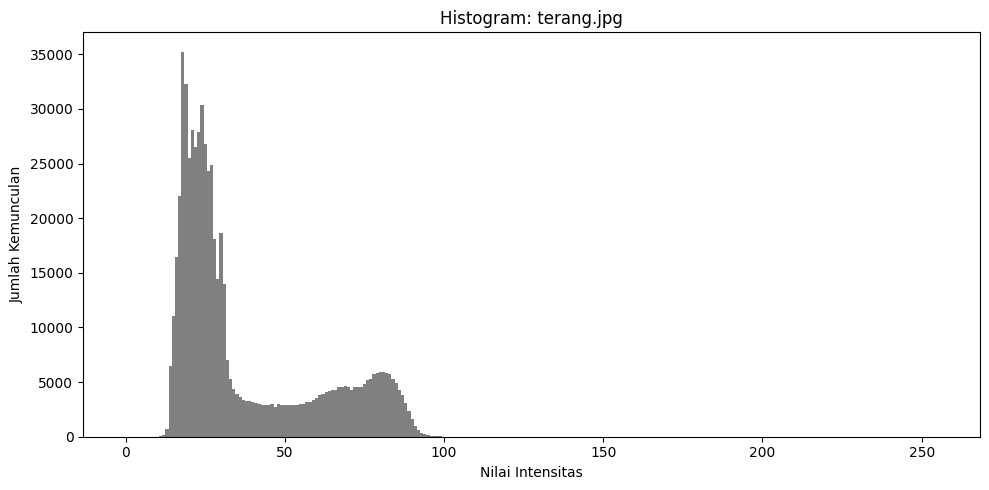

In [ ]:
# Greyscale
img = cv2.imread('/content/drive/MyDrive/Colab Notebooks/PCVK25_3F_09/Image Jobsheet/gelap.jpg', cv2.IMREAD_GRAYSCALE)
hist_img, bins_img = np.histogram(img, bins=256, range=(0, 256))

# Display the histogram
plt.figure(figsize=[10, 5])
plt.title('Histogram: gelap.jpg')
plt.xlabel('Nilai Intensitas')
plt.ylabel('Jumlah Kemunculan')
plt.bar(bins_img[:-1], hist_img, width=1, color='gray')

plt.tight_layout()
plt.show()

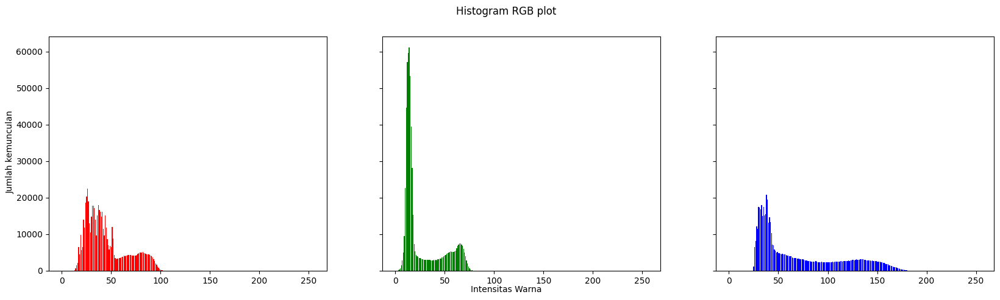

In [ ]:
# RGB
img = cv2.imread('/content/drive/MyDrive/Colab Notebooks/PCVK25_3F_09/Image Jobsheet/gelap.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

red, bins = np.histogram(img[:,:,0].ravel(), bins=256, range=[0,256])
green, bins = np.histogram(img[:,:,1].ravel(), bins=256, range=[0,256])
blue, bins = np.histogram(img[:,:,2].ravel(), bins=256, range=[0,256])

names = np.arange(256)
fig, axs = plt.subplots(1, 3, figsize=(20, 5), sharex=True, sharey=True)
fig.suptitle('Histogram RGB plot')
fig.text(0.09, 0.5, 'Jumlah kemunculan', va='center', rotation='vertical')
fig.text(0.5, 0.04, 'Intensitas Warna', ha='center')
axs[0].bar(names, red, color='red')
axs[1].bar(names, green, color='green')
axs[2].bar(names, blue, color='blue')
plt.show()

Analisis :

# 2. Terapkan transformasi brightness dan contrast (linear/log brightness).
- Tentukan nilai b (brightness) dan a (contrast) yang sesuai agar data tampak natural seperti data asli.

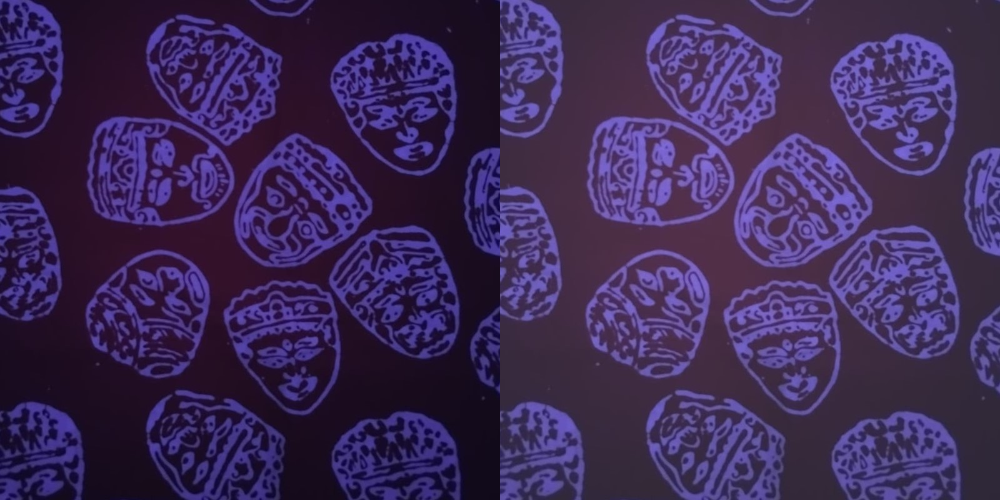

In [20]:
# Transformasi Linear Brightness
img = cv2.imread('/content/drive/MyDrive/Colab Notebooks/PCVK25_3F_09/Image Jobsheet/gelap.jpg')
img_bc= cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

b = int(30)

img_bc = cv2.convertScaleAbs (img, beta=b)
final_frame = cv2.hconcat((img, img_bc))
cv2_imshow(final_frame)

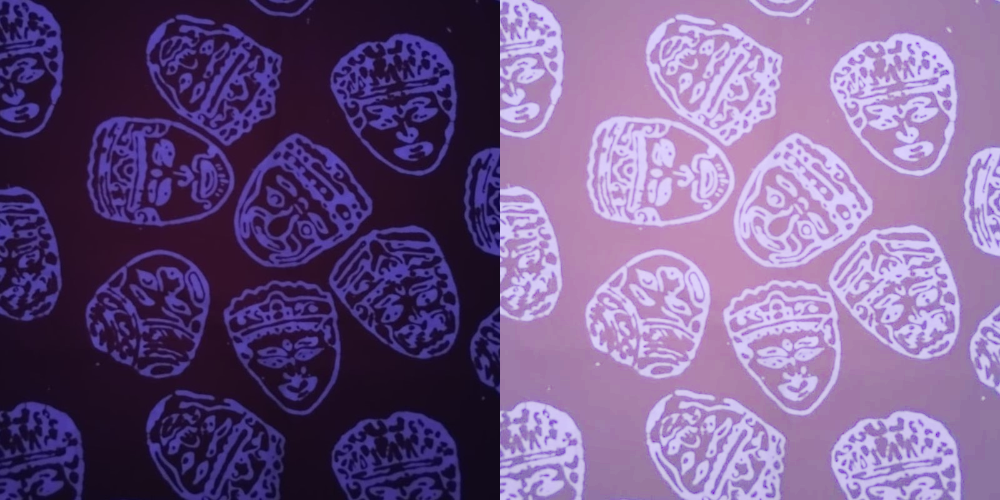

In [ ]:
# Transformasi Logaritmic Brightness
img = cv2.imread('/content/drive/MyDrive/Colab Notebooks/PCVK25_3F_09/Image Jobsheet/gelap.jpg')

c = float(30)

# Rumus log transformation
img_float = img.astype(np.float32)
log_transform_img = c * np.log(1 + img_float)
log_transform_img = (log_transform_img / np.max(log_transform_img) * 255).astype(np.uint8)

final_frame = cv2.hconcat((img, log_transform_img))
cv2_imshow(final_frame)

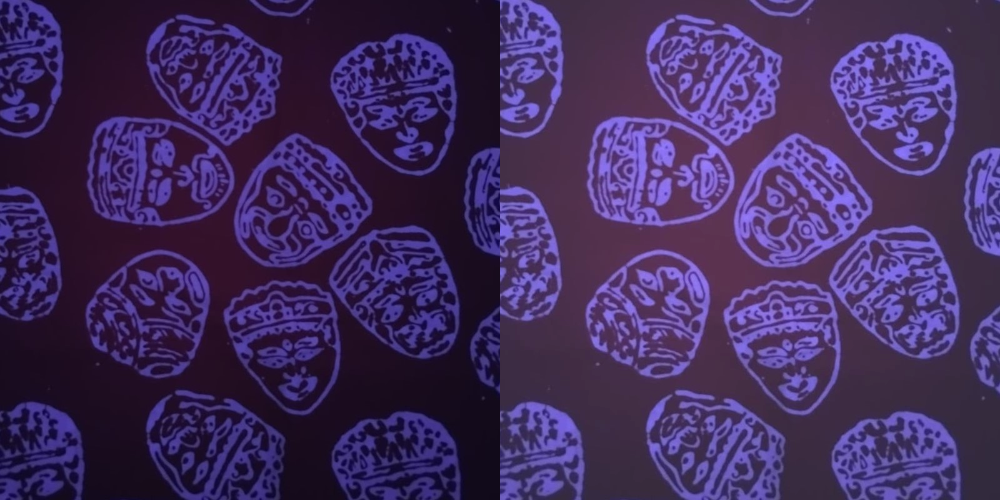

In [ ]:
# Contrast
img = cv2.imread('/content/drive/MyDrive/Colab Notebooks/PCVK25_3F_09/Image Jobsheet/gelap.jpg')
b = int(30)
a = float(1.2)

img_bc = cv2.convertScaleAbs (img, alpha = a, beta = b)
final_frame = cv2.hconcat((img, img_bc))
cv2_imshow(final_frame)

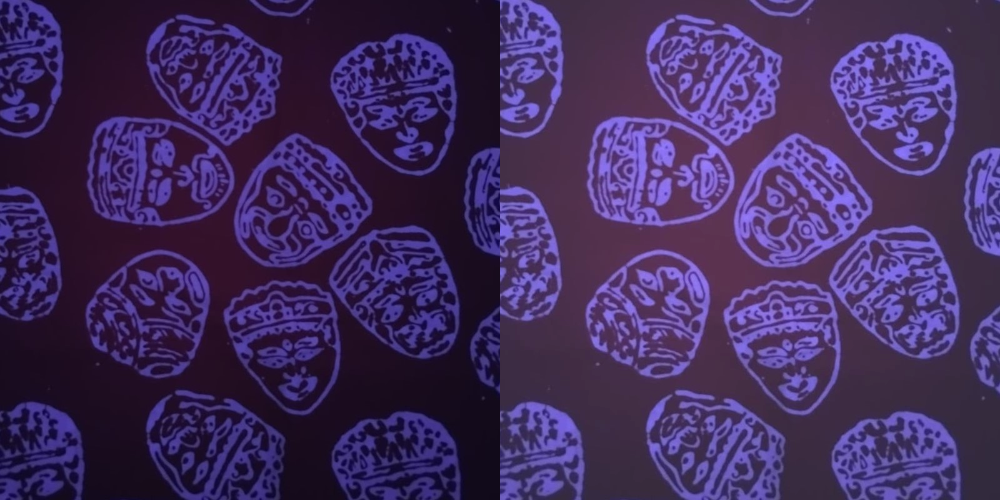

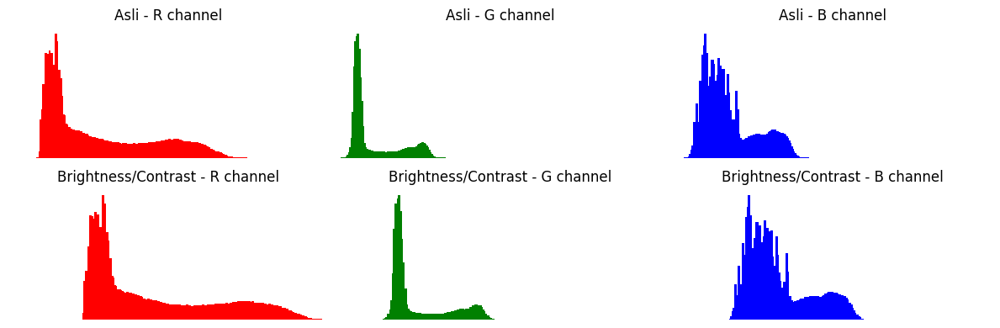

In [23]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

# Baca gambar
img = cv2.imread('/content/drive/MyDrive/Colab Notebooks/PCVK25_3F_09/Image Jobsheet/gelap.jpg')

# Atur nilai brightness dan contrast
alpha = 1.2  # contrast
beta = 30    # brightness

# Ubah brightness dan contrast
img_bc = cv2.convertScaleAbs(img, alpha=alpha, beta=beta)

# Tampilkan perbandingan gambar
final_frame = cv2.hconcat((img, img_bc))
cv2_imshow(final_frame)

# Fungsi menampilkan histogram RGB
def show_histograms_bar(original, enhanced):
    colors = ('r', 'g', 'b')
    plt.figure(figsize=(12,4))

    for i, col in enumerate(colors):
        # Histogram gambar asli
        plt.subplot(2, 3, i + 1)
        hist = cv2.calcHist([original], [i], None, [256], [0, 256])
        plt.bar(range(256), hist.flatten(), color=col, width=2)
        plt.xlim([0, 256])
        plt.title(f'Asli - {col.upper()} channel')
        plt.axis('off')

        # Histogram gambar hasil brightness/contrast
        plt.subplot(2, 3, i + 4)
        hist2 = cv2.calcHist([enhanced], [i], None, [256], [0, 256])
        plt.bar(range(256), hist2.flatten(), color=col, width=2)
        plt.xlim([0, 256])
        plt.title(f'Brightness/Contrast - {col.upper()} channel')
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# Tampilkan histogram dalam bentuk batang seperti contoh
show_histograms_bar(img, img_bc)


# 3. Lakukan histogram equalization untuk memperbaiki sebaran kontras.
- Bandingkan hasil visual dan histogram sebelum–sesudah.
- Perhatikan apakah motif dan detail kain lebih terlihat jelas.
- Pastikan tekstur daun atau permukaan sayur menjadi lebih terlihat.

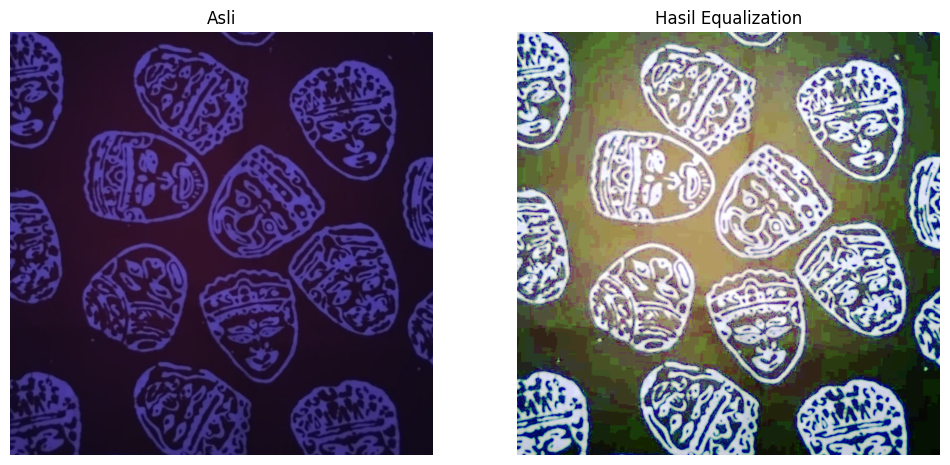

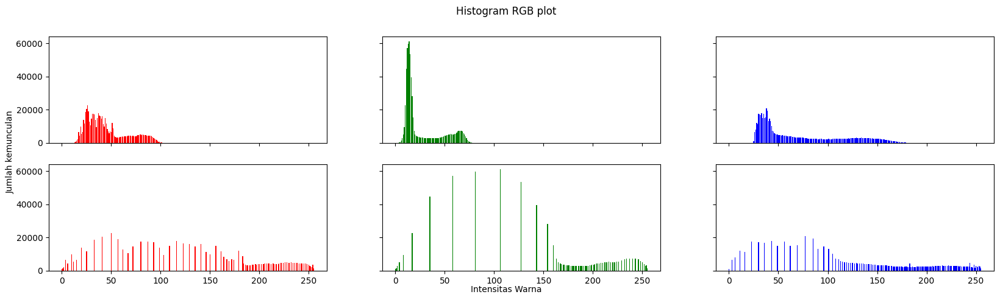

In [ ]:
# Histogram Equalization
img = cv2.imread('/content/drive/MyDrive/Colab Notebooks/PCVK25_3F_09/Image Jobsheet/gelap.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

r, g, b = cv2.split(img)

red, bins = np.histogram(r.ravel(), bins=256, range=[0,256])
green, bins = np.histogram(g.ravel(), bins=256, range=[0,256])
blue, bins = np.histogram(b.ravel(), bins=256, range=[0,256])

red_eq = cv2.equalizeHist(r)
green_eq = cv2.equalizeHist(g)
blue_eq = cv2.equalizeHist(b)

red_eq_hist, bins = np.histogram(red_eq.ravel(), bins=256, range=[0,256])
green_eq_hist, bins = np.histogram(green_eq.ravel(), bins=256, range=[0,256])
blue_eq_hist, bins = np.histogram(blue_eq.ravel(), bins=256, range=[0,256])
img_eq = cv2.merge((red_eq, green_eq, blue_eq))

fig, ax = plt.subplots(1, 2, figsize=(12, 6))
ax[0].imshow(img)
ax[0].set_title('Asli')
ax[0].axis('off')
ax[1].imshow(img_eq)
ax[1].set_title('Hasil Equalization')
ax[1].axis('off')
plt.show()

names = np.arange(256)
fig, axs = plt.subplots(2, 3, figsize=(20, 5), sharex=True, sharey=True)
fig.suptitle('Histogram RGB plot')
fig.text(0.09, 0.5, 'Jumlah kemunculan', va='center', rotation='vertical')
fig.text(0.5, 0.04, 'Intensitas Warna', ha='center')
axs[0][0].bar(names, red, color='red')
axs[0][1].bar(names, green, color='green')
axs[0][2].bar(names, blue, color='blue')

axs[1][0].bar(names, red_eq_hist, color='red')
axs[1][1].bar(names, green_eq_hist, color='green')
axs[1][2].bar(names, blue_eq_hist, color='blue')

plt.show()

Analisis :

# 4. Terapkan filter spasial:
- Low-pass filter untuk menghaluskan noise atau tekstur berlebih pada permukaan kain, untuk menghaluskan noise pada permukaan atau bayangan di sekitar sayur.
- High-pass atau Laplacian filter untuk menajamkan tepi motif batik atau untuk menajamkan tepi daun, batang, atau detail tekstur pada sayur.

In [3]:
# fungsi tampilan gambar
def show_images(original, filtered, title_filtered="Filtered Image"):
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    if len(original.shape) == 3:
        plt.imshow(cv2.cvtColor(original, cv2.COLOR_BGR2RGB))
    else:
        plt.imshow(original, cmap='gray')
    plt.title('Original Image')
    plt.axis()

    plt.subplot(1, 2, 2)
    if len(filtered.shape) == 3:
        plt.imshow(cv2.cvtColor(filtered, cv2.COLOR_BGR2RGB))
    else:
        plt.imshow(filtered, cmap='gray')
    plt.title(title_filtered)
    plt.axis()

    plt.tight_layout()
    plt.show()

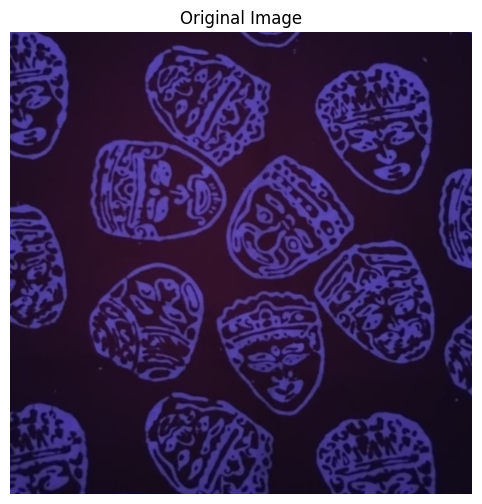

In [9]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
from scipy.signal import convolve2d

image = cv2.imread('/content/drive/MyDrive/Colab Notebooks/PCVK25_3F_09/Image Jobsheet/gelap.jpg')
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Tampilkan gambar original
plt.figure(figsize=(8, 6))
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')
plt.show()

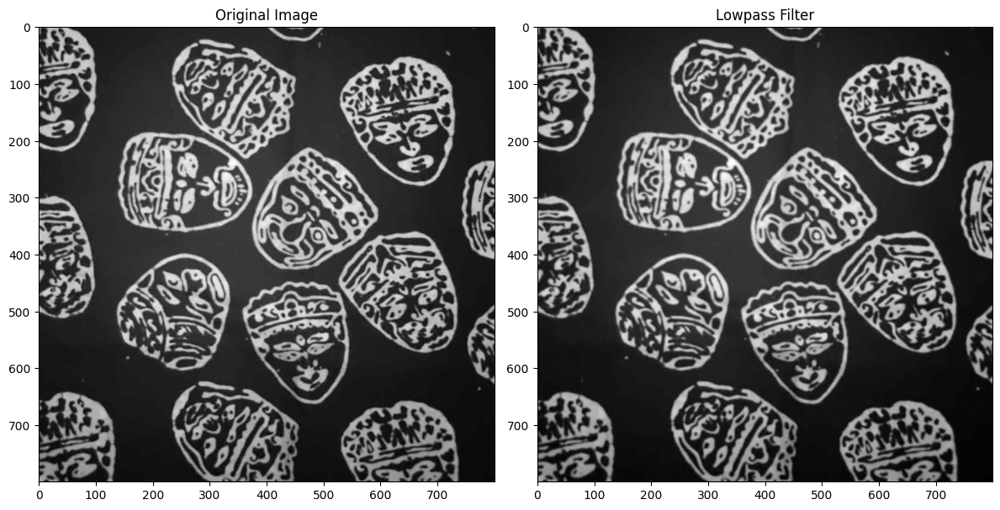

In [14]:
# Low Pass Filter
kernel_lowpass = np.array([
    [1/12, 1/12, 1/12],
    [1/12, 4/12, 1/12],
    [1/12, 1/12, 1/12]
])

image_lowpass = convolve2d(image_gray, kernel_lowpass, mode='same', boundary='symm')
show_images(image_gray, image_lowpass, "Lowpass Filter")


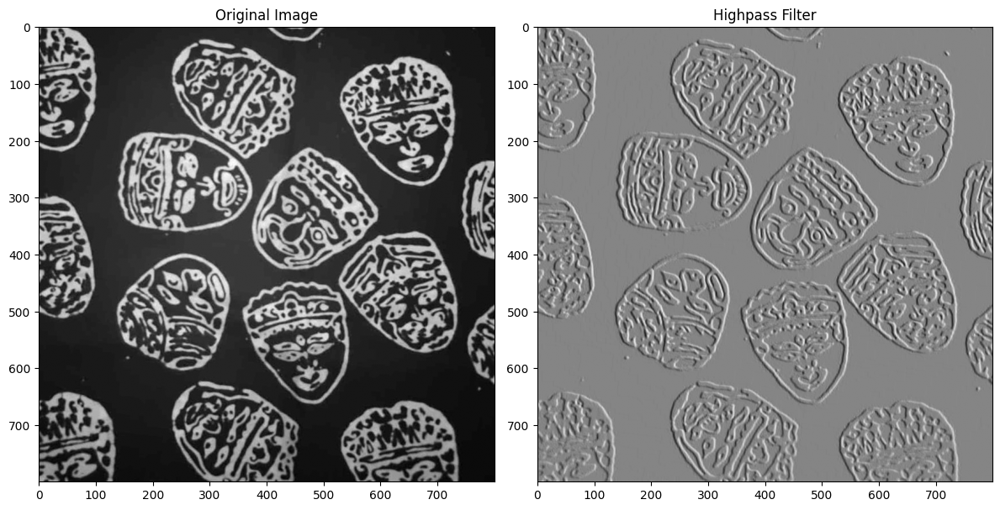

In [ ]:
# High Pass Filter
kernel_highpass = np.array([
    [-1, 0, 1],
    [-1, 0, 3],
    [-3, 0, 1]
])

image_highpass = convolve2d(image_gray, kernel_highpass, mode='same', boundary='symm')
show_images(image_gray, image_highpass, "Highpass Filter")

# 5. Implementasikan Floyd–Steinberg Dithering untuk menurunkan kedalaman warna sesuai data anda (bit-depth 4–6 bit), lalu analisis bagaimana efeknya terhadap kehalusan gradasi warna motif batik setelah reduksi warna dilakukan atau terhadap detail warna alami sayur

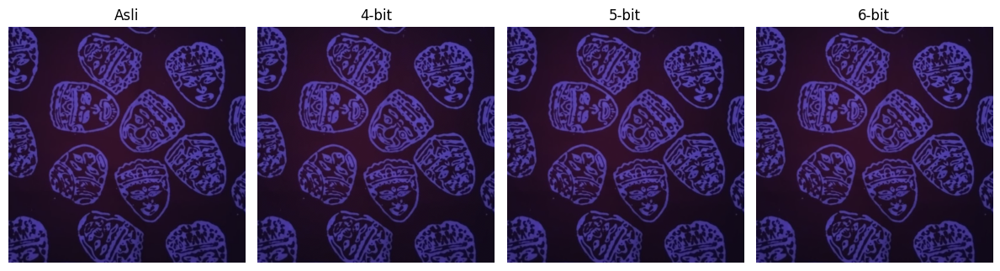

In [15]:
def floyd_steinberg_dithering_color(image, bit_depth):
    img = image.astype(np.float32) / 255.0

    rows, cols, channels = img.shape
    max_val = (2**bit_depth) - 1
    levels = np.linspace(0, 1, max_val + 1)

    for c in range(channels):
        for y in range(rows):
            for x in range(cols):
                old_pixel = img[y, x, c]
                new_pixel = min(levels, key=lambda l: abs(l - old_pixel))
                img[y, x, c] = new_pixel
                quant_error = old_pixel - new_pixel

                # distribusi
                if x + 1 < cols:
                    img[y, x + 1, c] += quant_error * 7 / 16
                if y + 1 < rows:
                    if x - 1 >= 0:
                        img[y + 1, x - 1, c] += quant_error * 3 / 16
                    img[y + 1, x, c] += quant_error * 5 / 16
                    if x + 1 < cols:
                        img[y + 1, x + 1, c] += quant_error * 1 / 16

    dithered_image = (img * 255).astype(np.uint8)
    return dithered_image

img = cv2.imread('/content/drive/MyDrive/Colab Notebooks/PCVK25_3F_09/Image Jobsheet/gelap.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# list bit depth
bit_depths = [4, 5, 6]

plt.figure(figsize=(12, 4))
plt.subplot(1, len(bit_depths) + 1, 1)
plt.imshow(img)
plt.title("Asli")
plt.axis('off')

for i, bit in enumerate(bit_depths, start=2):
    dithered_img = floyd_steinberg_dithering_color(img, bit)
    plt.subplot(1, len(bit_depths) + 1, i)
    plt.imshow(dithered_img)
    plt.title(f"{bit}-bit")
    plt.axis('off')

plt.tight_layout()
plt.show()